# Import packages

In [1]:
import numpy as np
import scanpy as sc
import seaborn as sns
import pandas as pd
import re
from anndata import AnnData
import decoupler as dc
from scipy.stats import ttest_ind

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as patches
%matplotlib inline

sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=150,
    facecolor="white",
    frameon=False,
)

# Define functions

In [2]:
def patch_plot(patches, ax=None, order='sort', w=0.25, h=0, legend_right=True,
               show_ticks=False):
    cur_patches = pd.Series(patches)

    if order == 'sort':
        order = list(np.sort(cur_patches.index))

    data = pd.Series([1] * len(order), index=order[::-1])
    if ax is None:
        if h == 0:
            h = 0.3 * len(patches)
        _, ax = plt.subplots(figsize=(w, h))

    data.plot(kind='barh', color=[cur_patches[x] for x in data.index], width=1, ax=ax)
    ax.set_xticks([])
    if legend_right:
        ax.yaxis.tick_right()

    sns.despine(offset={'left': -2}, ax=ax)

    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(False)

    if not show_ticks:
        ax.tick_params(length=0)

    return ax

In [3]:
def plot_stacked_bar_custom_palette(df, cell_type, palette,
                                    status_colors, patient_order, target_column):
    if cell_type == 'Immune':
        df_filtered = df[df['cell_type'] == 'Immune']
    elif cell_type == 'Fibro':
        df_filtered = df[df['cell_type'] == 'Fibro']
    elif cell_type == 'TME':
        df_filtered = df[df['cell_type'].isin(['Immune', 'Stromal'])]
    else:
        df_filtered = df
    print(df_filtered.shape)
        
    pivot_df = df_filtered.pivot(index='patient_id',
                                 columns=target_column,
                                 values='proportion').fillna(0)

    pat_order = patient_order
    pivot_df = pivot_df.loc[pat_order]
    
    fig, ax = plt.subplots(figsize=(12, 6))
    
    pivot_df.plot(kind='bar', stacked=True,
                  color=[color_mapping[sub] for sub in pivot_df.columns],
                  ax=ax)

    ax.set_title(f'Stacked Proportions of {cell_type} Cell Subtypes per Patient with Annotations')
    ax.set_ylabel('Proportion')
    ax.set_xlabel('Patient ID')
    ax.legend(title='Cell Subtype', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.set_xticklabels([convertion_EOC_back[x] for x in patient_order],
                   rotation=0, fontsize=14)

    plt.tight_layout()
    plt.grid(False)

    return fig

# Palettes

In [4]:
color_mapping = {
    'B cells': '#33658A',
    'Plasma cells': '#669EC8',
    'T cells': '#68A691',
    'NK cells': '#176B27',
    'pDC': '#279AF1',
    'Macrophages+DC': '#F3B391',
    'Mast cells': '#ED5233',
    'Fibroblasts': '#9792E3',
    'EOC': '#3D405B',
    'Endothelial cells': '#C64191',
}

<Axes: >

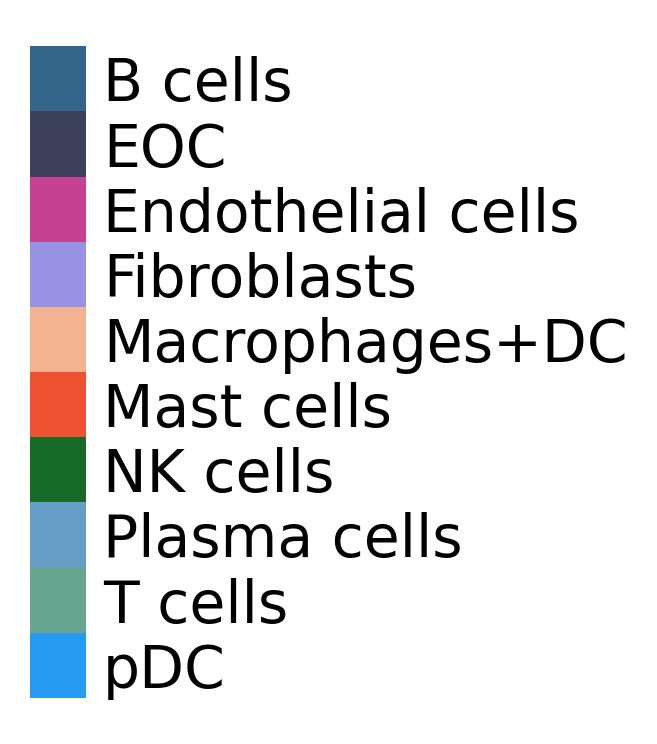

In [5]:
patch_plot(color_mapping)

In [6]:
patients_colors_EOC = {
    'EOC3': '#987284',
    'EOC87': '#EFA9AE',
    'EOC204': '#EBA889',
    'EOC115': '#BC4B51',
    'EOC372': '#5B8E7D',
    'EOC136': '#8A89C0',
    'EOC153': '#0081AF',
    'EOC227': '#90BEDE',
    'EOC649': '#A6D49F',
    'EOC1127': '#FFDF88'
}

<Axes: >

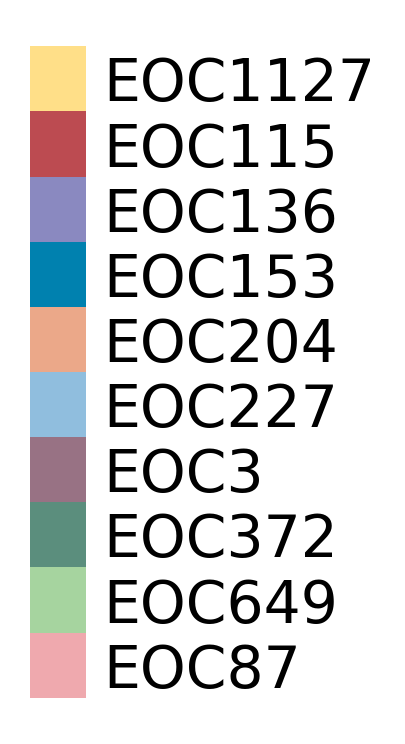

In [7]:
patch_plot(patients_colors_EOC)

In [8]:
color_mapping = {
    'EOC': '#F78764',
    'Immune': '#68A691',
    'Stromal': '#742792'
}

<Axes: >

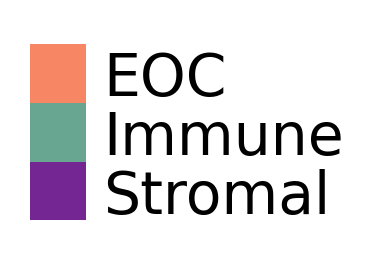

In [9]:
patch_plot(color_mapping)

In [10]:
HRD_palette = {
    'HRP': '#81A4CD',
    'HRD': '#FFA047'}

<Axes: >

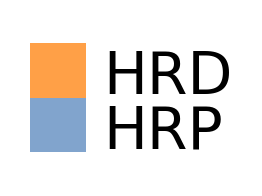

In [11]:
patch_plot(HRD_palette)

In [12]:
tissue_palette = {
    'Mesentary': '#6F9CEB',
    'Omentum': '#5B8C5A',
    'Peritoneum': '#7F2982'
}

<Axes: >

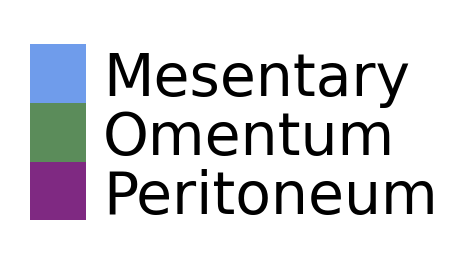

In [13]:
patch_plot(tissue_palette)

# Annotation

In [14]:
status_palette = {'Refractory': '#f28482',
                  'Responsive': '#81b29a',
                  'Intermediate': '#4280A7'
                 }

In [15]:
patients = [
    'EOC3', 'EOC87', 'EOC204', 'EOC115', # refractory
    'EOC1127', 'EOC153', 'EOC372', 'EOC227', 'EOC649', 'EOC136' # responsive
]

In [16]:
samples_ordered = ['EOC87_pPer', 'EOC3_pPer', 'EOC204_pMes', 'EOC115_pPer',
                   'EOC153_pOme', 'EOC136_pMes', 'EOC1127_pOme', 'EOC227_pOme', 'EOC649_pOme', 'EOC372_pPer']

patients_ordered = ['EOC87', 'EOC3', 'EOC204', 'EOC115',
                    'EOC153', 'EOC136', 'EOC1127', 'EOC227', 'EOC649', 'EOC372']

In [17]:
mymeta = pd.read_csv('/mnt/storageBig8/work/afenteva/ChemoRef/REVIEW1/scRNA/meta_patients.tsv',
            sep='\t', index_col=0)
mymeta.index = mymeta['publication_code']
mymeta.index.name = ''
mymeta['Definition'] = mymeta['Status'].replace({'Refractory': 'R',
                                                 'Responsive': 'S'})
mymeta.head(3)

,scRNA_sample,publication_code,Status,SBS3,tissue,Definition
,,,,,,
EOC3,EOC3_pPer,EOC3,Refractory,HRP,Peritoneum,R
EOC87,EOC87_pPer,EOC87,Refractory,HRP,Peritoneum,R
EOC204,EOC204_pMes,EOC204,Refractory,HRD,Mesentary,R


In [18]:
mymeta

,scRNA_sample,publication_code,Status,SBS3,tissue,Definition
,,,,,,
EOC3,EOC3_pPer,EOC3,Refractory,HRP,Peritoneum,R
EOC87,EOC87_pPer,EOC87,Refractory,HRP,Peritoneum,R
EOC204,EOC204_pMes,EOC204,Refractory,HRD,Mesentary,R
EOC115,EOC115_pPer,EOC115,Refractory,HRP,Peritoneum,R
EOC372,EOC372_pPer,EOC372,Responsive,HRD,Peritoneum,S
EOC136,EOC136_pMes,EOC136,Responsive,HRD,Mesentary,S
EOC153,EOC153_pOme,EOC153,Responsive,HRD,Omentum,S
EOC227,EOC227_pOme,EOC227,Responsive,HRP,Omentum,S
EOC649,EOC649_pOme,EOC649,Responsive,HRP,Omentum,S


In [19]:
meta = pd.read_csv('/mnt/storageBig8/work/afenteva/ChemoRef/REVIEW1/scRNA/meta.tsv',
            sep='\t', index_col=0)

In [20]:
meta['orig.ident'].value_counts()

EOC3_pPer       3154
EOC204_pMes     2587
EOC136_pMes     2506
EOC227_pOme     2179
EOC115_pPer     2105
EOC87_pPer      1526
EOC1127_pOme    1193
EOC372_pPer      712
EOC649_pOme      490
EOC153_pOme      330
Name: orig.ident, dtype: int64

In [21]:
meta.head(2)

,orig.ident,nFeature_RNA,nCount_RNA,nReads_RNA,percent.mt,cell_type,patient,Status,SBS3,tissue,phase,cell_id
AACACGTAGTTAAGTG-EOC649_pOme,EOC649_pOme,9354,129922,2110719,10.517079,EOC,EOC649,Responsive,HRP,Omentum,Primary,AACACGTAGTTAAGTG-EOC649_pOme
AACGTTGGTTTGTGTG-EOC649_pOme,EOC649_pOme,6051,49375,789956,8.380759,EOC,EOC649,Responsive,HRP,Omentum,Primary,AACGTTGGTTTGTGTG-EOC649_pOme


# Read counts

In [22]:
adata = sc.read_h5ad('/mnt/storageBig8/work/afenteva/ChemoRef/REVIEW1/scRNA/adata.h5ad')

In [23]:
adata

AnnData object with n_obs × n_vars = 16782 × 41139

In [24]:
adata.var_names_make_unique()
adata.obs['sample'] = [meta.loc[cell_id, 'orig.ident'] for cell_id in adata.obs.index]
adata.obs['patient_id'] = [meta.loc[cell_id, 'patient'] for cell_id in adata.obs.index]
adata.obs['anatomical_location'] = [meta.loc[cell_id, 'tissue'] for cell_id in adata.obs.index]
adata.obs['cell_type'] = [meta.loc[cell_id, 'cell_type'] for cell_id in adata.obs.index]
adata.obs['nCount_RNA'] = [meta.loc[cell_id, 'nCount_RNA'] for cell_id in adata.obs.index]
adata.obs['nFeature_RNA'] = [meta.loc[cell_id, 'nFeature_RNA'] for cell_id in adata.obs.index]
adata.obs['percent.mt'] = [meta.loc[cell_id, 'percent.mt'] for cell_id in adata.obs.index]
adata.obs['status'] = [meta.loc[cell_id, 'Status'] for cell_id in adata.obs.index]
adata.obs['SBS3'] = [meta.loc[cell_id, 'SBS3'] for cell_id in adata.obs.index]
adata.obs['cell_id'] = adata.obs.index

In [25]:
adata.layers['counts'] = adata.X
adata

AnnData object with n_obs × n_vars = 16782 × 41139
    obs: 'sample', 'patient_id', 'anatomical_location', 'cell_type', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'status', 'SBS3', 'cell_id'
    layers: 'counts'

In [26]:
# adata.write_h5ad('/mnt/storageBig8/work/afenteva/ChemoRef/REVIEW1/scRNA_adata.h5ad')

## Normalizing the data

In [27]:
adata_copy = adata.copy()

In [28]:
print('normalize_total')
sc.pp.normalize_total(adata, target_sum=1e4,
                      exclude_highly_expressed=True)
print('log1p')
sc.pp.log1p(adata)

print('raw')
adata.raw = adata

print('regress_out')
sc.pp.regress_out(adata, ['nCount_RNA', 'percent.mt'], n_jobs=5)
print('scale')
sc.pp.scale(adata, max_value=10)
adata.layers['normalized'] = adata.X

normalize_total
log1p
raw
regress_out
scale


In [29]:
sc.tl.pca(adata, svd_solver='arpack', random_state=41)

sc.pp.neighbors(adata,
                n_neighbors=15,
                n_pcs=30, random_state=41
               )

sc.tl.umap(adata, random_state=41, spread=1., min_dist=.5)

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/l

In [30]:
adata

AnnData object with n_obs × n_vars = 16782 × 41139
    obs: 'sample', 'patient_id', 'anatomical_location', 'cell_type', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'status', 'SBS3', 'cell_id'
    var: 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'normalized'
    obsp: 'distances', 'connectivities'

# Markers expression check

In [31]:
# Epithelial cancer cells: WFDC2, PAX8, EPCAM
# Stromal cells: COL12A, FGFR1, DCN
# Immune cells: CD79A, PTPRC, FCER1G

In [32]:
mrks = {
    'Housekeeping\ngenes': ['GAPDH', 'ACTB', 'B2M'],
    'EOC': ['WFDC2', 'PAX8', 'EPCAM'],
    'Stromal': ['COL12A1', 'FGFR1', 'DCN'],
    'Immune': ['CD79A', 'PTPRC', 'FCER1G']
}

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


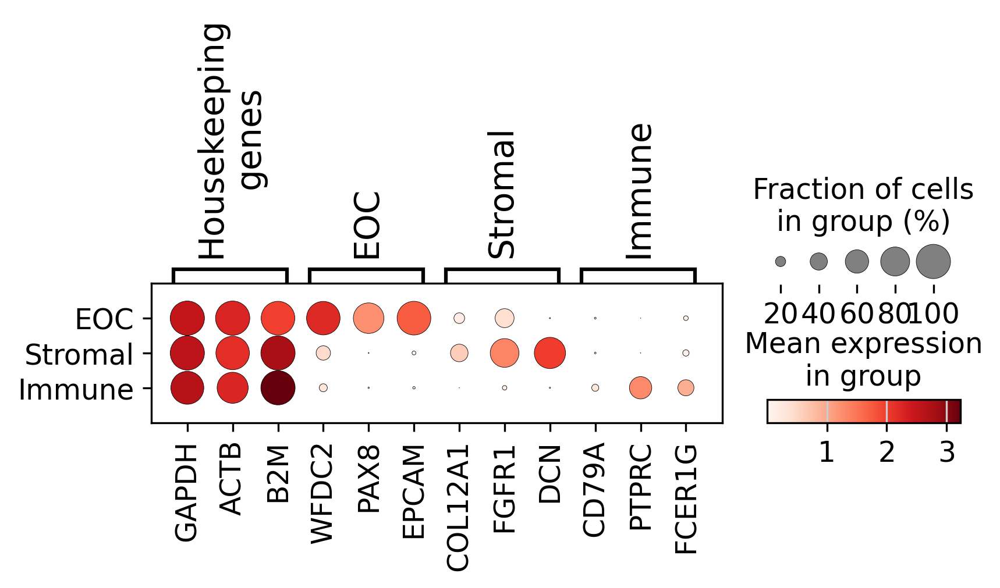

In [33]:
dp = sc.pl.dotplot(adata,
                   mrks,
                   'cell_type',
                   show=False,
                   categories_order=['EOC', 'Stromal', 'Immune'], smallest_dot=0
                  )
ax = dp['mainplot_ax']

# QC check

In [34]:
# The percentage of UMI counts originating from mitochondrial gene
#
# < 12 for cancer cells
# < 7.5 for stromal and immune cells

meta.groupby('cell_type')['percent.mt'].max() 

cell_type
EOC        11.991527
Immune      7.497657
Stromal     7.465312
Name: percent.mt, dtype: float64

In [35]:
# The number of detected genes
# 
# > 1552 for cancer cells
# > 1024 for stromal cells
# > 512 for immune cells

meta.groupby('cell_type')['nFeature_RNA'].min()

cell_type
EOC        1554
Immune      512
Stromal    1024
Name: nFeature_RNA, dtype: int64

In [36]:
# The number of UMI counts
# 
# > 4075 for cancer cells
# > 2048 for stromal cells
# > 1024 for immune cells

meta.groupby('cell_type')['nCount_RNA'].min()

cell_type
EOC        4706
Immune     1027
Stromal    2174
Name: nCount_RNA, dtype: int64

In [37]:
# The number of UMI counts
# 
# > 8192 for cancer cells
# > 4096 for stromal cells
# > 2896 for immune cells

meta.groupby('cell_type')['nReads_RNA'].min()

cell_type
EOC        8356
Immune     2915
Stromal    4677
Name: nReads_RNA, dtype: int64

In [38]:
meta.shape

(16782, 12)

# UMAP full data

In [39]:
sc.set_figure_params(figsize=(10, 8), frameon=False,
                     dpi_save=600, vector_friendly=True)
sc.settings.n_jobs=2

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


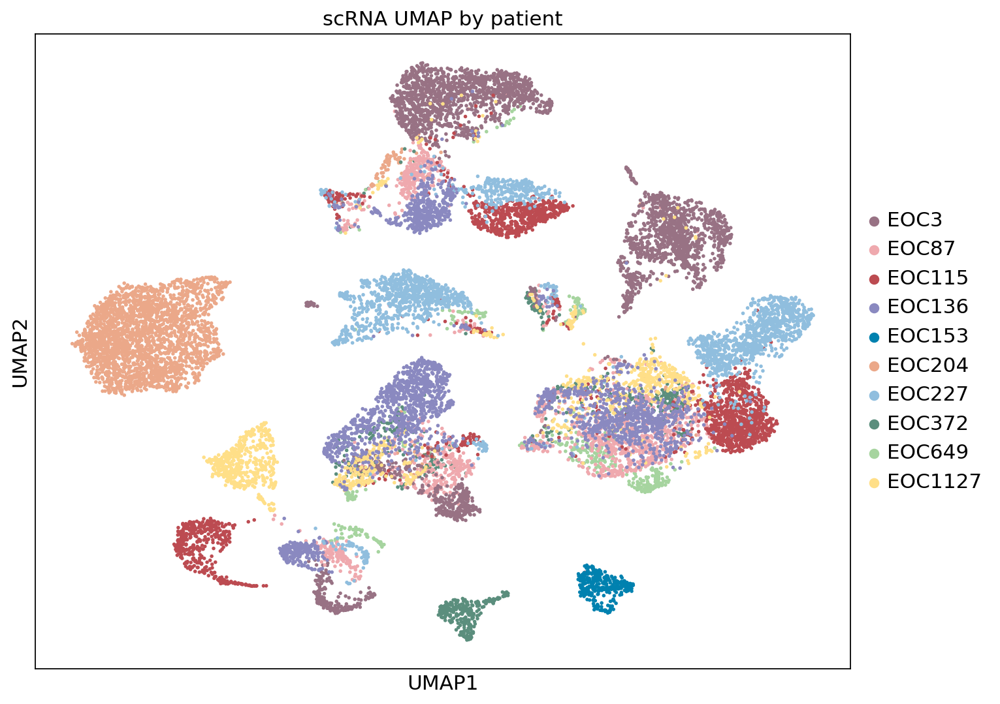

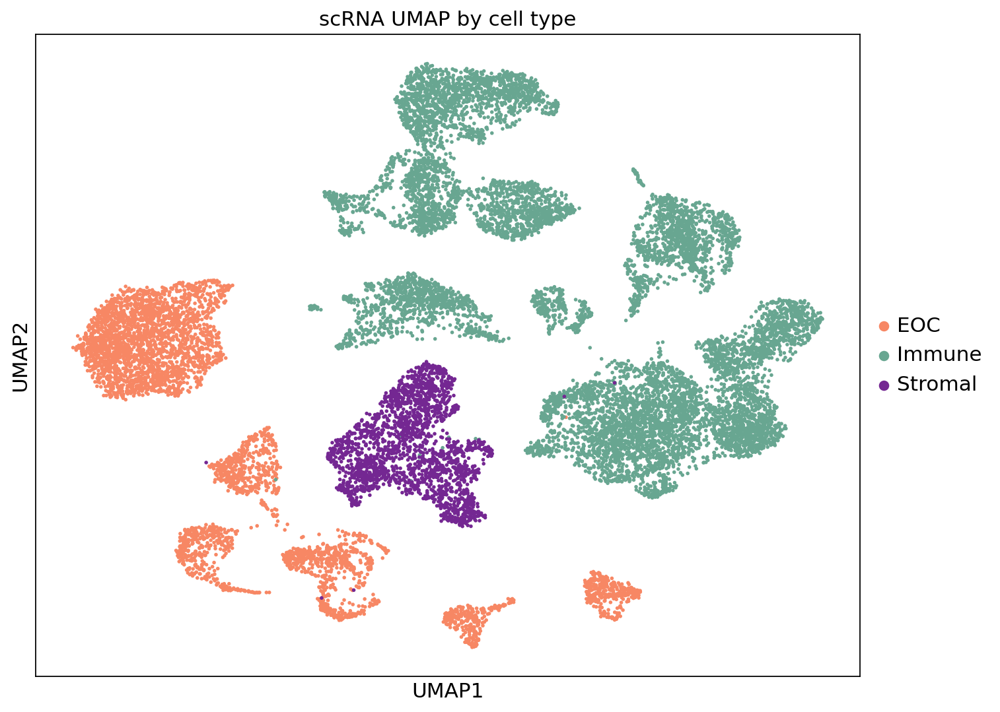

In [49]:
f1 = sc.pl.umap(adata,
                color='patient_id',
                title='scRNA UMAP by patient',
                frameon=True,
                legend_fontweight='normal',
                legend_fontsize=14,
                s=25,
                palette=patients_colors_EOC,
                return_fig=True)

f2 = sc.pl.umap(adata,
                color='cell_type',
                title='scRNA UMAP by cell type',
                frameon=True,
                legend_fontweight='normal',
                legend_fontsize=14,
                s=25,
                palette=color_mapping,
                return_fig=True)

# Boxplot with TME

In [41]:
meta_copy = meta.copy()
cell_counts = meta.groupby(['patient', 'cell_type']).size().reset_index(name='count')

total_counts = meta_copy.groupby(['patient']).size().reset_index(name='total_count')
proportions = pd.merge(cell_counts, total_counts, on=['patient'])
proportions['proportion'] = proportions['count'] / proportions['total_count']

In [42]:
def plot_stacked_bar_custom_palette(df, cell_type, palette,
                                    status_colors, patient_order, target_column):
    if cell_type == 'Immune':
        df_filtered = df[df['cell_type'] == 'Immune']
    elif cell_type == 'Fibro':
        df_filtered = df[df['cell_type'] == 'Fibro']
    elif cell_type == 'TME':
        df_filtered = df[df['cell_type'].isin(['Immune', 'Stromal'])]
    else:
        df_filtered = df
    print(df_filtered.shape)
        
    pivot_df = df_filtered.pivot(index='patient',
                                 columns=target_column,
                                 values='proportion').fillna(0)

    pat_order = patients_ordered
    pivot_df = pivot_df.loc[pat_order]
    
    fig, ax = plt.subplots(figsize=(12, 6))
    pivot_df.plot(kind='bar',
                  stacked=True,
                  color=[color_mapping[sub] for sub in pivot_df.columns],
                  ax=ax)

    ax.set_title(f'Stacked proportions of TME per patient')
    ax.set_ylabel('Proportion')
    ax.set_xlabel('Patient ID')
    ax.legend(title='Cell Subtype', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.set_xticklabels([x + ' ({status})'.format(status=mymeta.loc[x, 'Definition']) for x in patients_ordered],
                       rotation=90, fontsize=14)
    plt.tight_layout()
    plt.grid(False)
    ax2 = ax.twinx()
    counts=[np.log1p(x) for x in list(meta_copy[meta_copy.cell_type == 'EOC'].groupby('patient')['cell_type'].count()\
        .loc[patients_ordered].values)]
    ax2.bar([x + 0.35 for x in range(10)],
            counts, width=0.1, color='grey', alpha=0.95 )
    ax2.set_ylabel('Log N of cells')
    ax2.set_ylim(0, max(counts) + 0.4) 


    plt.tight_layout()
    plt.grid(False)
    
    return fig

(28, 5)


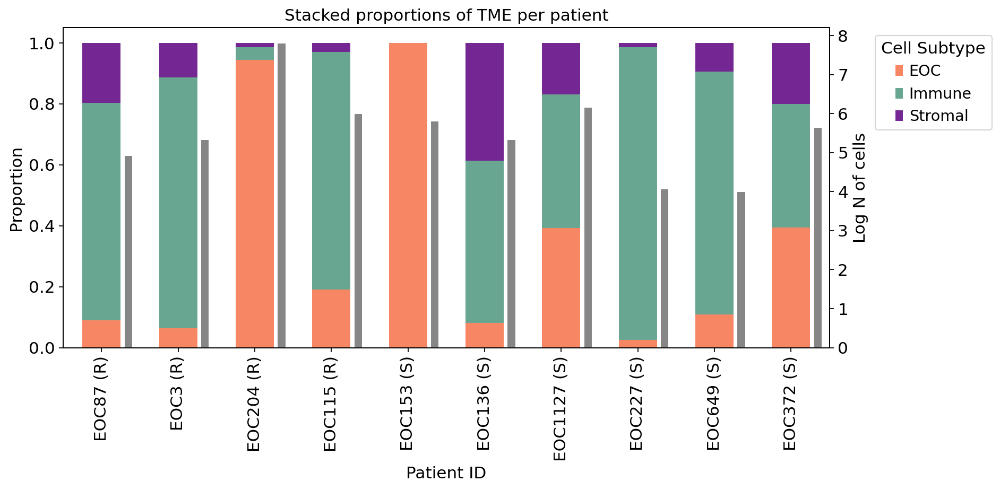

In [43]:
fig = plot_stacked_bar_custom_palette(proportions, 'All',
                                      palette=color_mapping,
                                      status_colors=status_palette,
                                      patient_order=patients_ordered,
                                      target_column='cell_type'
                                     )

# EOC analysis

In [44]:
meta_EOC = meta[meta['cell_type'] == 'EOC']
adata_EOC = adata_copy[adata_copy.obs.cell_type == 'EOC']

In [45]:
adata_EOC

View of AnnData object with n_obs × n_vars = 4577 × 41139
    obs: 'sample', 'patient_id', 'anatomical_location', 'cell_type', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'status', 'SBS3', 'cell_id'
    layers: 'counts'

## Normalizing the data

In [46]:
print('normalize_total')
sc.pp.normalize_total(adata_EOC, target_sum=1e4, exclude_highly_expressed=True)
print('log1p')
sc.pp.log1p(adata_EOC)

print('raw')
adata_EOC.raw = adata_EOC

print('regress_out')
sc.pp.regress_out(adata_EOC, ['nCount_RNA', 'percent.mt'], n_jobs=15)
print('scale')
sc.pp.scale(adata_EOC, max_value=10)

normalize_total


/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


log1p
raw
regress_out
scale


In [47]:
sc.tl.pca(adata_EOC, svd_solver='arpack', random_state=41)

sc.pp.neighbors(adata_EOC, n_neighbors=30,
                n_pcs=50, random_state=41)

sc.tl.umap(adata_EOC, random_state=41, spread=.45, min_dist=1.2, n_components=2)

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


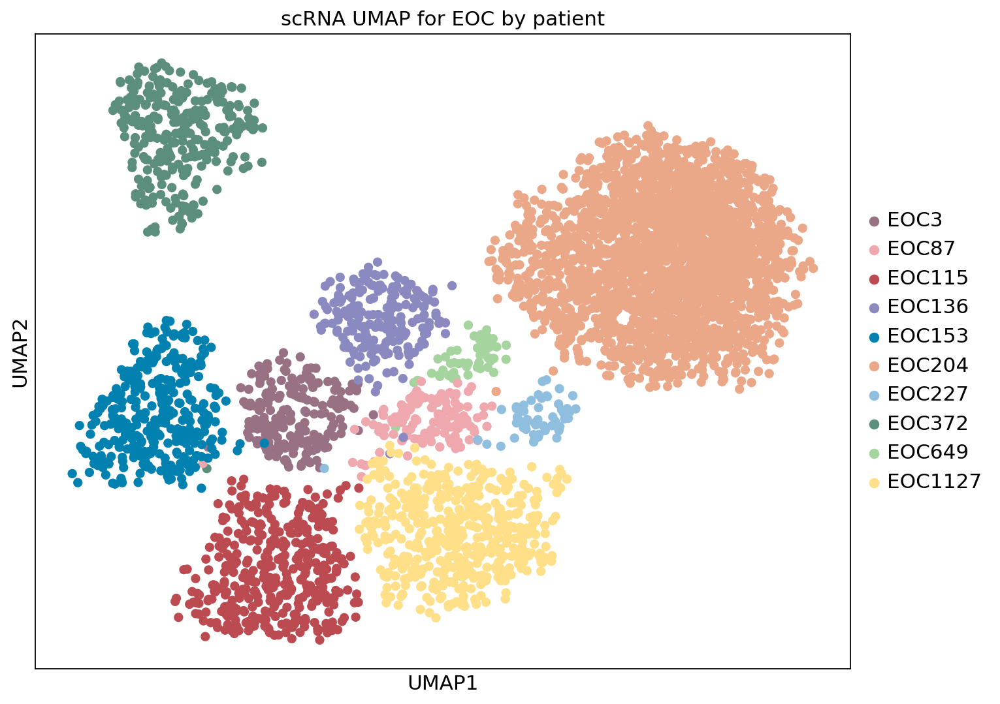

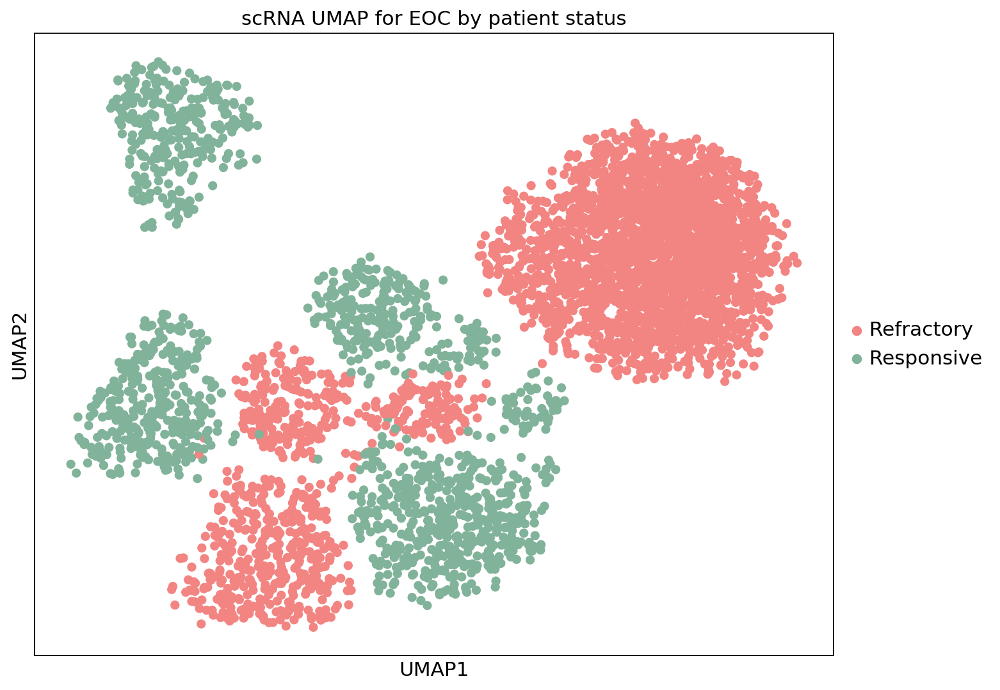

In [50]:
f1 = sc.pl.umap(adata_EOC,
                color='patient_id',
                title='scRNA UMAP for EOC by patient',
                frameon=True,
                legend_fontweight='normal',
                legend_fontsize=14,
                s=165,
                palette=patients_colors_EOC,
                return_fig=True)

f2 = sc.pl.umap(adata_EOC,
                color='status',
                title='scRNA UMAP for EOC by patient status',
                frameon=True,
                legend_fontweight='normal',
                legend_fontsize=14,
                s=165,
                palette=status_palette,
                return_fig=True)

## DecoupleR

### Progeny

In [51]:
progeny = dc.get_progeny(organism='human', top=500)
progeny.head(3)

,source,target,weight,p_value
0,Androgen,TMPRSS2,11.490631,0.000000e+00
1,Androgen,NKX3-1,10.622551,2.242078e-44
2,Androgen,MBOAT2,10.472733,4.624285e-44


In [52]:
dc.run_mlm(
    mat=adata_EOC,
    net=progeny,
    source='source',
    target='target',
    weight='weight',
    verbose=True
)

4482 features of mat are empty, they will be removed.
Running mlm on mat with 4577 samples and 36657 targets for 14 sources.


In [53]:
adata_EOC.obsm['progeny_mlm_estimate'] = adata_EOC.obsm['mlm_estimate'].copy()
adata_EOC.obsm['progeny_mlm_pvals'] = adata_EOC.obsm['mlm_pvals'].copy()
adata_EOC

AnnData object with n_obs × n_vars = 4577 × 41139
    obs: 'sample', 'patient_id', 'anatomical_location', 'cell_type', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'status', 'SBS3', 'cell_id'
    var: 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'patient_id_colors', 'status_colors', 'SBS3_colors', 'anatomical_location_colors'
    obsm: 'X_pca', 'X_umap', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [54]:
acts_EOC = dc.get_acts(adata_EOC, obsm_key='mlm_estimate')
acts_EOC

AnnData object with n_obs × n_vars = 4577 × 14
    obs: 'sample', 'patient_id', 'anatomical_location', 'cell_type', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'status', 'SBS3', 'cell_id'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'patient_id_colors', 'status_colors', 'SBS3_colors', 'anatomical_location_colors'
    obsm: 'X_pca', 'X_umap', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals'

In [55]:
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=200,
    facecolor="white",
    frameon=False,
)

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


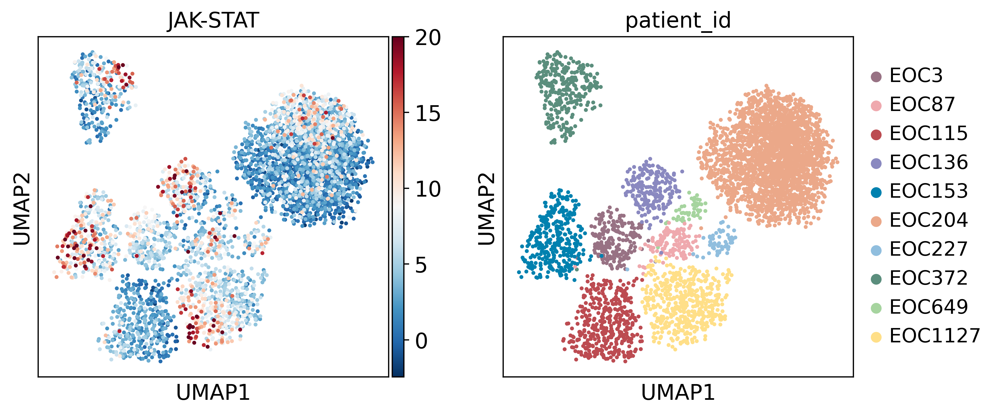

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


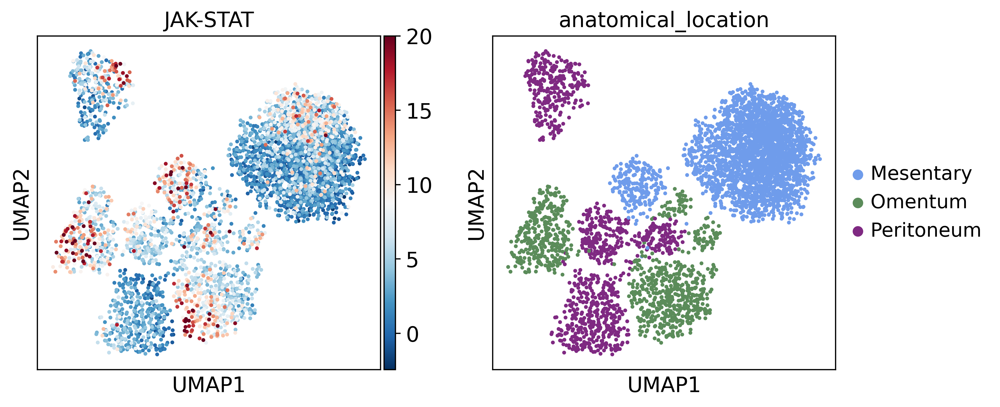

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


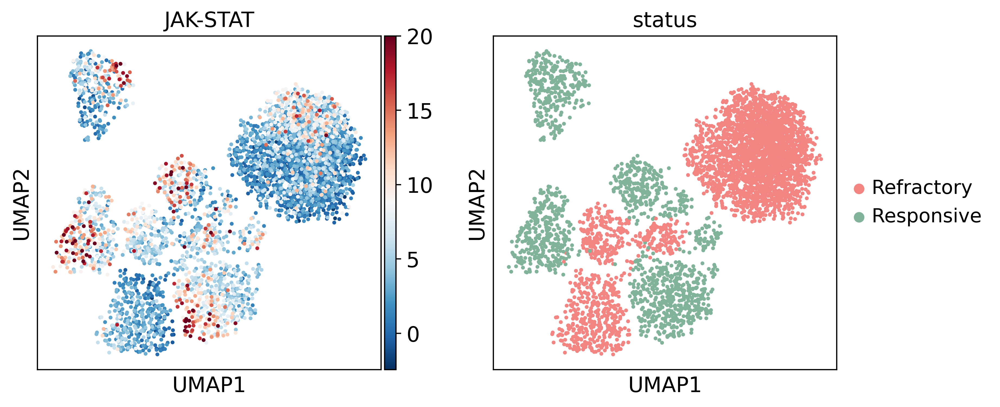

In [57]:
sc.pl.umap(acts_EOC,
           color=['JAK-STAT', 'patient_id'],
           frameon=True,
           cmap='RdBu_r',
           vmax=20,
           palette=patients_colors_EOC)

sc.pl.umap(acts_EOC,
           color=['JAK-STAT', 'anatomical_location'],
           frameon=True,
           cmap='RdBu_r',
           vmax=20,
           palette=tissue_palette)

sc.pl.umap(acts_EOC,
           color=['JAK-STAT', 'status'],
           frameon=True,
           cmap='RdBu_r',
           vmax=20,
           palette=status_palette)

In [58]:
acts_EOC.obs['JAK-STAT-activity'] = acts_EOC.obsm['mlm_estimate']['JAK-STAT']

In [59]:
mymeta = mymeta.merge(acts_EOC.obs.groupby('patient_id')['JAK-STAT-activity'].median(),
             left_on='publication_code', right_on='patient_id')
mymeta

,scRNA_sample,publication_code,Status,SBS3,tissue,Definition,JAK-STAT-activity
0,EOC3_pPer,EOC3,Refractory,HRP,Peritoneum,R,5.394009
1,EOC87_pPer,EOC87,Refractory,HRP,Peritoneum,R,5.580631
2,EOC204_pMes,EOC204,Refractory,HRD,Mesentary,R,1.813063
3,EOC115_pPer,EOC115,Refractory,HRP,Peritoneum,R,2.343315
4,EOC372_pPer,EOC372,Responsive,HRD,Peritoneum,S,3.954986
5,EOC136_pMes,EOC136,Responsive,HRD,Mesentary,S,7.385967
6,EOC153_pOme,EOC153,Responsive,HRD,Omentum,S,8.102290
7,EOC227_pOme,EOC227,Responsive,HRP,Omentum,S,5.285056
8,EOC649_pOme,EOC649,Responsive,HRP,Omentum,S,4.333024
9,EOC1127_pOme,EOC1127,Responsive,HRP,Omentum,S,6.301234


/tmp/ipykernel_191489/3838412488.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='tissue', y='JAK-STAT-activity', data=mymeta,
/tmp/ipykernel_191489/3838412488.py:12: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x='tissue', y='JAK-STAT-activity', data=mymeta,
/tmp/ipykernel_191489/3838412488.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='SBS3', y='JAK-STAT-activity', data=mymeta,
/tmp/ipykernel_191489/3838412488.py:35: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(x='SBS3', y='JAK-

Text(0, 0.5, 'median JAK-STAT-activity')

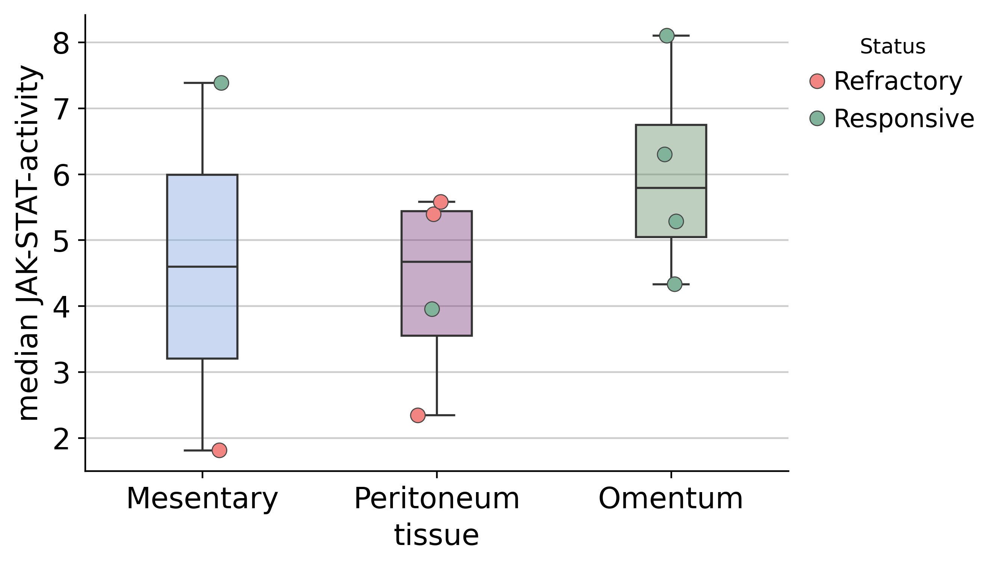

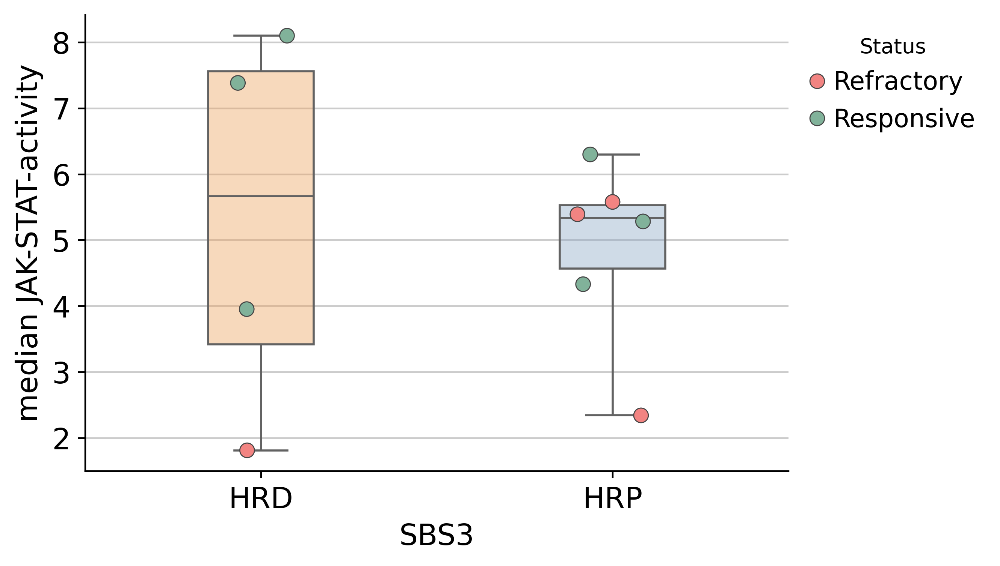

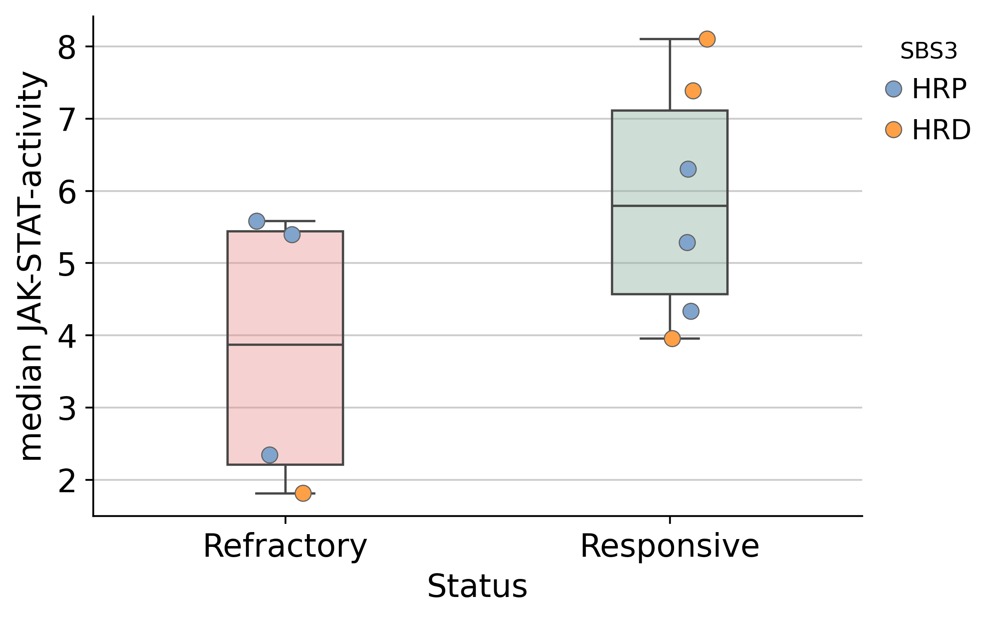

In [60]:
# sns.set_style("white")
f, ax = plt.subplots(figsize=(6, 4))

ax = sns.boxplot(x='tissue', y='JAK-STAT-activity', data=mymeta,
               ax=ax, order=['Mesentary', 'Peritoneum', 'Omentum'],
               width=0.3, palette=tissue_palette,
            saturation=0.8, fliersize=2, linewidth=1, whis=5)
for patch in ax.patches:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, 0.4))

sns.stripplot(x='tissue', y='JAK-STAT-activity', data=mymeta,
              order=['Mesentary', 'Peritoneum', 'Omentum'],
              ax=ax, s=7, alpha=1,
              edgecolor='gray', linewidth=0.5, palette=status_palette,
              jitter=True, hue='Status')
sns.despine(top=True, right=True)
ax.legend(title='Status', fontsize=12, title_fontsize=10,
          frameon=False, loc='upper left', alignment='center',
          bbox_to_anchor=(1, 0.5, 0.5, 0.5))
ax.set_ylabel('median JAK-STAT-activity')



f, ax = plt.subplots(figsize=(6, 4)) 

ax = sns.boxplot(x='SBS3', y='JAK-STAT-activity', data=mymeta,
               ax=ax, order=['HRD', 'HRP'],
               width=0.3, palette=HRD_palette,
            saturation=0.8, fliersize=2, linewidth=1, whis=5)
for patch in ax.patches:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, 0.4))

sns.stripplot(x='SBS3', y='JAK-STAT-activity', data=mymeta,
              order=['HRD', 'HRP'],
              ax=ax, s=7, alpha=1,
              edgecolor='gray', linewidth=0.5, palette=status_palette,
              jitter=True, hue='Status')
sns.despine(top=True, right=True)
ax.legend(title='Status', fontsize=12, title_fontsize=10,
          frameon=False, loc='upper left', alignment='center',
          bbox_to_anchor=(1, 0.5, 0.5, 0.5))
ax.set_ylabel('median JAK-STAT-activity')



f, ax = plt.subplots(figsize=(6, 4))

ax = sns.boxplot(x='Status', y='JAK-STAT-activity', data=mymeta,
               ax=ax, order=['Refractory', 'Responsive'],
               width=0.3, palette=status_palette,
            saturation=0.8, fliersize=2, linewidth=1, whis=5)
for patch in ax.patches:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, 0.4))

sns.stripplot(x='Status', y='JAK-STAT-activity', data=mymeta,
              order=['Refractory', 'Responsive'],
              ax=ax, s=7, alpha=1,
              edgecolor='gray', linewidth=0.5, palette=HRD_palette,
              jitter=True, hue='SBS3')
sns.despine(top=True, right=True)
ax.legend(title='SBS3', fontsize=12, title_fontsize=10,
          frameon=False, loc='upper left', alignment='center',
          bbox_to_anchor=(1, 0.5, 0.5, 0.5))
ax.set_ylabel('median JAK-STAT-activity')

### CollecTRI

In [61]:
net = dc.get_collectri(organism='human', split_complexes=False)
net.head(5)

,source,target,weight,PMID
0,MYC,TERT,1,10022128;10491298;10606235;10637317;10723141;1...
1,SPI1,BGLAP,1,10022617
2,SMAD3,JUN,1,10022869;12374795
3,SMAD4,JUN,1,10022869;12374795
4,STAT5A,IL2,1,10022878;11435608;17182565;17911616;22854263;2...


In [62]:
dc.run_ulm(
    mat=adata_EOC,
    net=net,
    source='source',
    target='target',
    weight='weight',
    verbose=True
)

4482 features of mat are empty, they will be removed.
Running ulm on mat with 4577 samples and 36657 targets for 761 sources.


In [63]:
adata_EOC.obsm['collectri_ulm_estimate'] = adata_EOC.obsm['ulm_estimate'].copy()
adata_EOC.obsm['collectri_ulm_pvals'] = adata_EOC.obsm['ulm_pvals'].copy()
acts_EOC = dc.get_acts(adata_EOC, obsm_key='ulm_estimate')

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


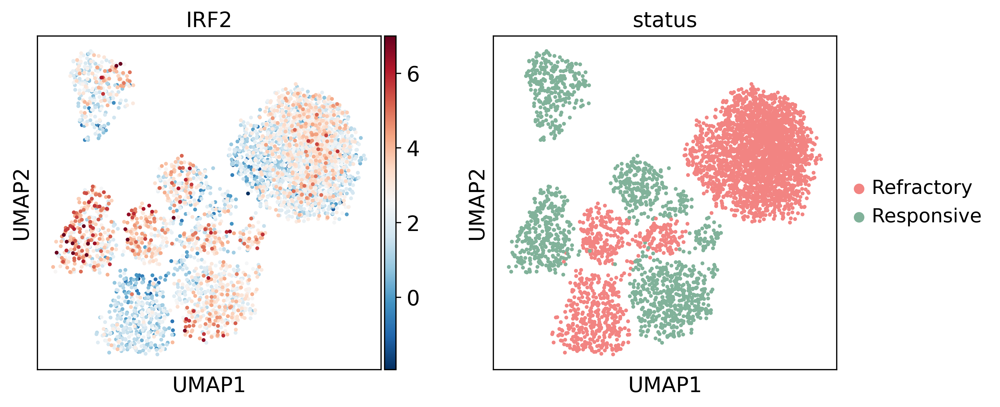

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


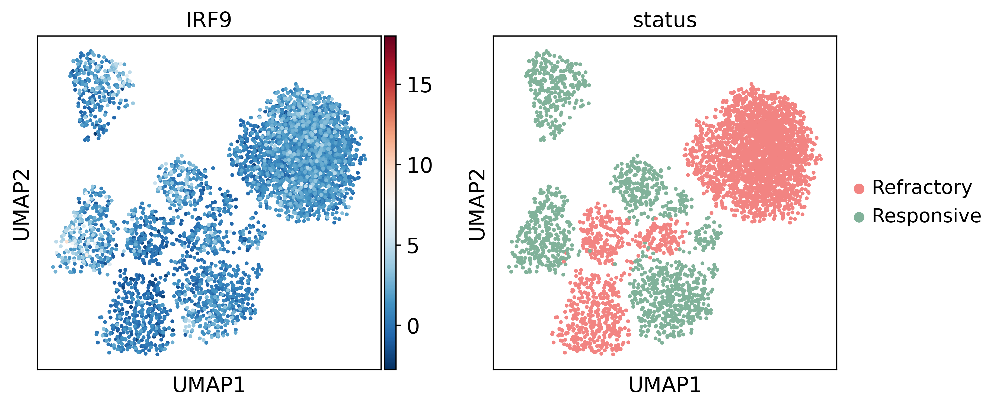

In [65]:
sc.pl.umap(acts_EOC, color=['IRF2', 'status'], cmap='RdBu_r', vmax=7, frameon=True)
# sc.pl.violin(acts_EOC, keys=['IRF2'], groupby='status', rotation=90, )

sc.pl.umap(acts_EOC, color=['IRF9', 'status'], cmap='RdBu_r', vmax=18, frameon=True)
# sc.pl.violin(acts_EOC, keys=['IRF9'], groupby='status', rotation=90)

In [66]:
a = acts_EOC.obsm['collectri_ulm_estimate'].loc[acts_EOC[acts_EOC.obs['status'] == 'Responsive'].obs.index]
b = acts_EOC.obsm['collectri_ulm_estimate'].loc[acts_EOC[acts_EOC.obs['status'] == 'Refractory'].obs.index]

#### Plot for comparison

In [67]:
a['patient'] = [x.split('-')[1].split('_')[0] for x in a.index]
b['patient'] = [x.split('-')[1].split('_')[0] for x in b.index]

a['status'] = 'Responsive'
b['status'] = 'Refractory'

combined_df = pd.concat([a[['IRF2', 'IRF9', 'status', 'patient']],
                         b[['IRF2', 'IRF9', 'status', 'patient']]])

In [68]:
import statsmodels.api as sm

In [69]:
model_gee_tumor = sm.GEE.from_formula("IRF2 ~ status", groups="patient", data=combined_df)
result_gee_tumor = model_gee_tumor.fit()
print(result_gee_tumor.summary())

                               GEE Regression Results                              
Dep. Variable:                        IRF2   No. Observations:                 4577
Model:                                 GEE   No. clusters:                       10
Method:                        Generalized   Min. cluster size:                  53
                      Estimating Equations   Max. cluster size:                2444
Family:                           Gaussian   Mean cluster size:               457.7
Dependence structure:         Independence   Num. iterations:                     2
Date:                     Tue, 08 Oct 2024   Scale:                           1.478
Covariance type:                    robust   Time:                         14:24:19
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                2.0293      0.124     16.378      0.000  

In [70]:
model_gee_tumor = sm.GEE.from_formula("IRF9 ~ status", groups="patient", data=combined_df)
result_gee_tumor = model_gee_tumor.fit()
print(result_gee_tumor.summary())

                               GEE Regression Results                              
Dep. Variable:                        IRF9   No. Observations:                 4577
Model:                                 GEE   No. clusters:                       10
Method:                        Generalized   Min. cluster size:                  53
                      Estimating Equations   Max. cluster size:                2444
Family:                           Gaussian   Mean cluster size:               457.7
Dependence structure:         Independence   Num. iterations:                     2
Date:                     Tue, 08 Oct 2024   Scale:                           1.946
Covariance type:                    robust   Time:                         14:24:20
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                0.7743      0.171      4.539      0.000  

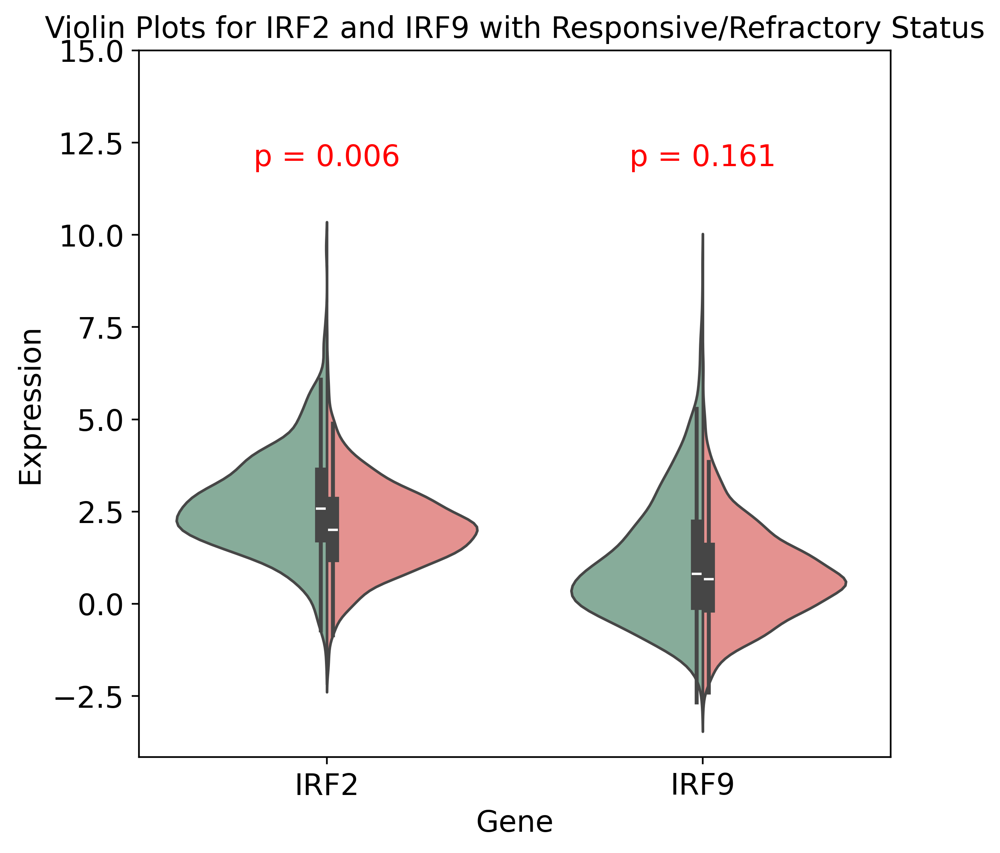

In [72]:
melted_df = combined_df.melt(id_vars='status', value_vars=['IRF2', 'IRF9'], 
                             var_name='Gene', value_name='Expression')

plt.figure(figsize=(6, 6))
sns.violinplot(x='Gene', y='Expression', hue='status', data=melted_df, 
               split=True, palette=status_palette, legend=False)

genes = ['IRF2', 'IRF9']
p_values = {'IRF2': 0.006, 'IRF9': 0.161}

for i, gene in enumerate(genes):
    p_val = p_values[gene]
    plt.text(i, max(melted_df['Expression']) + 2, f'p = {p_val:.3f}', 
             ha='center', va='bottom', color='red')

plt.title('Violin Plots for IRF2 and IRF9 with Responsive/Refractory Status')
plt.xlabel('Gene')
plt.ylabel('Expression')
plt.tight_layout()
plt.grid(False)
plt.ylim(top=15)

plt.show()

## ORA

In [73]:
# Filter by hallmark
msigdb = dc.get_resource('MSigDB')
msigdb = msigdb[msigdb['collection']=='hallmark']

# Remove duplicated entries
msigdb = msigdb[~msigdb.duplicated(['geneset', 'genesymbol'])]
msigdb.head(3)

,genesymbol,collection,geneset
11,MSC,hallmark,HALLMARK_TNFA_SIGNALING_VIA_NFKB
149,ICOSLG,hallmark,HALLMARK_TNFA_SIGNALING_VIA_NFKB
223,ICOSLG,hallmark,HALLMARK_INFLAMMATORY_RESPONSE


In [74]:
dc.run_ora(
    mat=adata_EOC,
    net=msigdb,
    source='geneset',
    target='genesymbol',
    verbose=True
)

4482 features of mat are empty, they will be removed.
Running ora on mat with 4577 samples and 36657 targets for 50 sources.


100%|█████████████████████████████████████████████████████████████████| 4577/4577 [00:23<00:00, 194.47it/s]


In [75]:
acts_EOC_msigdb = dc.get_acts(adata_EOC, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed
acts_EOC_msigdb_v = acts_EOC_msigdb.X.ravel()
max_e = np.nanmax(acts_EOC_msigdb_v[np.isfinite(acts_EOC_msigdb_v)])
acts_EOC_msigdb.X[~np.isfinite(acts_EOC_msigdb.X)] = max_e

acts_EOC_msigdb

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 4577 × 50
    obs: 'sample', 'patient_id', 'anatomical_location', 'cell_type', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'status', 'SBS3', 'cell_id'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'patient_id_colors', 'status_colors', 'SBS3_colors', 'anatomical_location_colors'
    obsm: 'X_pca', 'X_umap', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals', 'ulm_estimate', 'ulm_pvals', 'collectri_ulm_estimate', 'collectri_ulm_pvals', 'ora_estimate', 'ora_pvals'

In [76]:
acts_EOC_msigdb.obs['HALLMARK_INTERFERON_ALPHA_RESPONSE'] =\
acts_EOC_msigdb.obsm['ora_estimate']['HALLMARK_INTERFERON_ALPHA_RESPONSE']

In [77]:
# df_copy = df.drop_duplicates(subset=['patient_id', 'HALLMARK_IFN_ALPHA_RESPONSE'], keep='first')

In [78]:
mymeta.index = mymeta.publication_code

/tmp/ipykernel_191489/2422614050.py:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='patient_id', y='HALLMARK_INTERFERON_ALPHA_RESPONSE_scaled', data=df,
/tmp/ipykernel_191489/2422614050.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([x + ' ({status})'.format(status=mymeta.loc[x, 'Definition']) for x in patients_ordered],


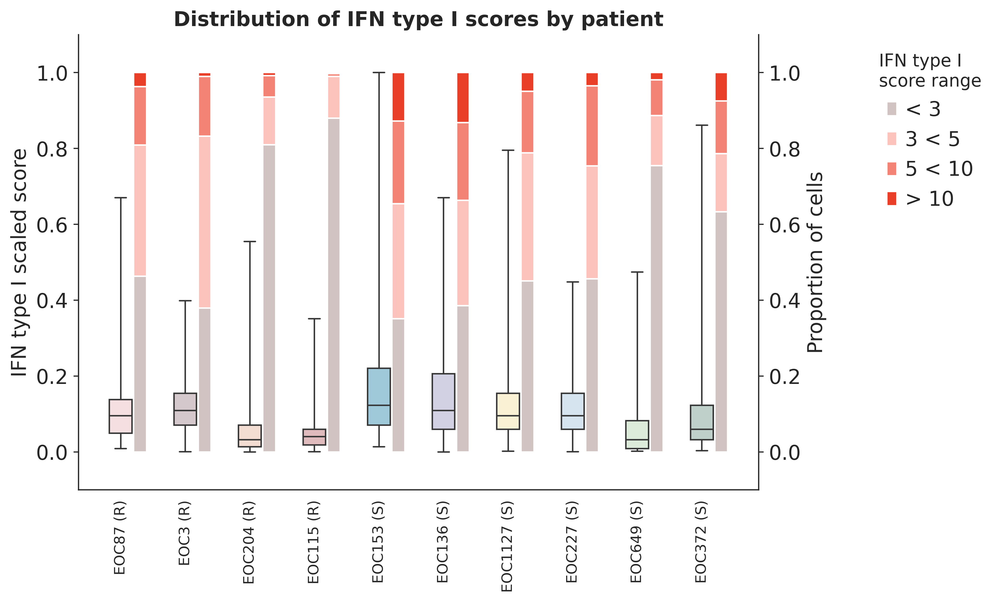

In [79]:
sns.set_style("white")

df = acts_EOC_msigdb.obs.copy()

df['sample'] = pd.Categorical(df['sample'],
                              categories=samples_ordered,
                              ordered=True)
df = df.sort_values(by='sample')

# Scale the JAK-STAT scores to be between 0 and 1
df['HALLMARK_INTERFERON_ALPHA_RESPONSE_scaled'] = (df['HALLMARK_INTERFERON_ALPHA_RESPONSE'] -\
                                                   df['HALLMARK_INTERFERON_ALPHA_RESPONSE'].min()) /\
(df['HALLMARK_INTERFERON_ALPHA_RESPONSE'].max() - df['HALLMARK_INTERFERON_ALPHA_RESPONSE'].min())

# Define JAK-STAT score ranges
df['HALLMARK_INTERFERON_ALPHA_RESPONSE_range'] = pd.cut(df['HALLMARK_INTERFERON_ALPHA_RESPONSE'],
                              bins=[-np.inf, 3, 5, 10, np.inf],
                              labels=['< 3', '3 < 5', '5 < 10', '> 10'])

bar_colors = {
    '< 3': '#D0C3C1',
    '3 < 5': '#FBC3BC',
    '5 < 10': '#F38375',
    '> 10': '#E93F29'
}

# Calculate proportions for the stacked bar plot
proportions = df.pivot_table(index='patient_id',
                             columns='HALLMARK_INTERFERON_ALPHA_RESPONSE_range',
                             aggfunc='size',
                             fill_value=0,
                             sort=False)
proportions = proportions.div(proportions.sum(axis=1), axis=0)

f, ax = plt.subplots(figsize=(10, 6))

ax = sns.boxplot(x='patient_id', y='HALLMARK_INTERFERON_ALPHA_RESPONSE_scaled', data=df,
               ax=ax, order=patients_ordered,
               width=0.35, palette=patients_colors_EOC,
            saturation=0.8, fliersize=1, linewidth=1, whis=10)
for patch in ax.patches:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, 0.4))

bottom = np.zeros(len(proportions))
bar_positions = np.arange(len(proportions)) + .3 
bar_width = 0.2  

for category in proportions.columns:
    ax.bar(bar_positions, proportions[category],
           bottom=bottom, label=category, width=bar_width,
           color=bar_colors[category])
    bottom += proportions[category].values

ax.set_xlabel('')
ax.set_ylabel('IFN type I scaled score', fontsize=14)
ax.legend(title='IFN type I\nscore range', fontsize=14, title_fontsize=12,
          frameon=False, loc='upper left', alignment='center', bbox_to_anchor=(1.15, 0.5, 0.5, 0.5))
ax.set_xticklabels([x + ' ({status})'.format(status=mymeta.loc[x, 'Definition']) for x in patients_ordered],
                   rotation=90, fontsize=10)
ax.set_title('Distribution of IFN type I scores by patient', fontsize=14, weight='bold')
ax.set_ylim(bottom=-0.1,top=1.1)

ax2 = ax.twinx()
ax2.set_ylim(-0.1, 1.1)
ax2.set_ylabel('Proportion of cells', fontsize=14)
sns.despine(f, ax, top=True, right=False)

plt.tight_layout()

plt.show()

In [81]:
acts_EOC_msigdb.obs = acts_EOC_msigdb.obs.rename(columns={'HALLMARK_INTERFERON_ALPHA_RESPONSE':
                                    'HALLMARK_IFN_ALPHA_RESPONSE'})

In [82]:
sns.set_style("white")

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


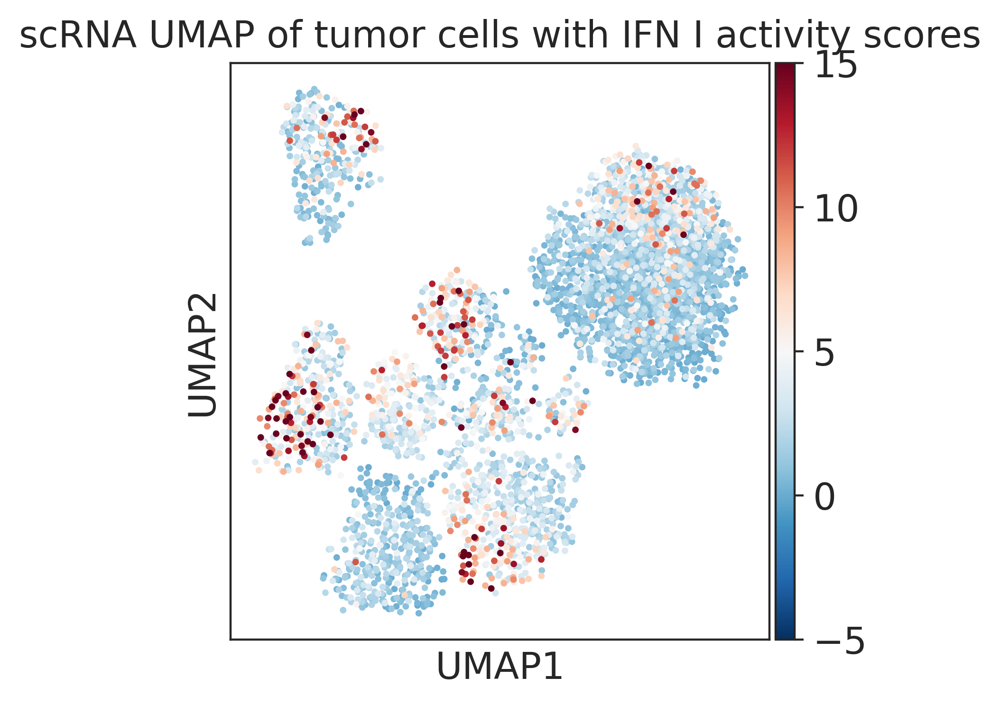

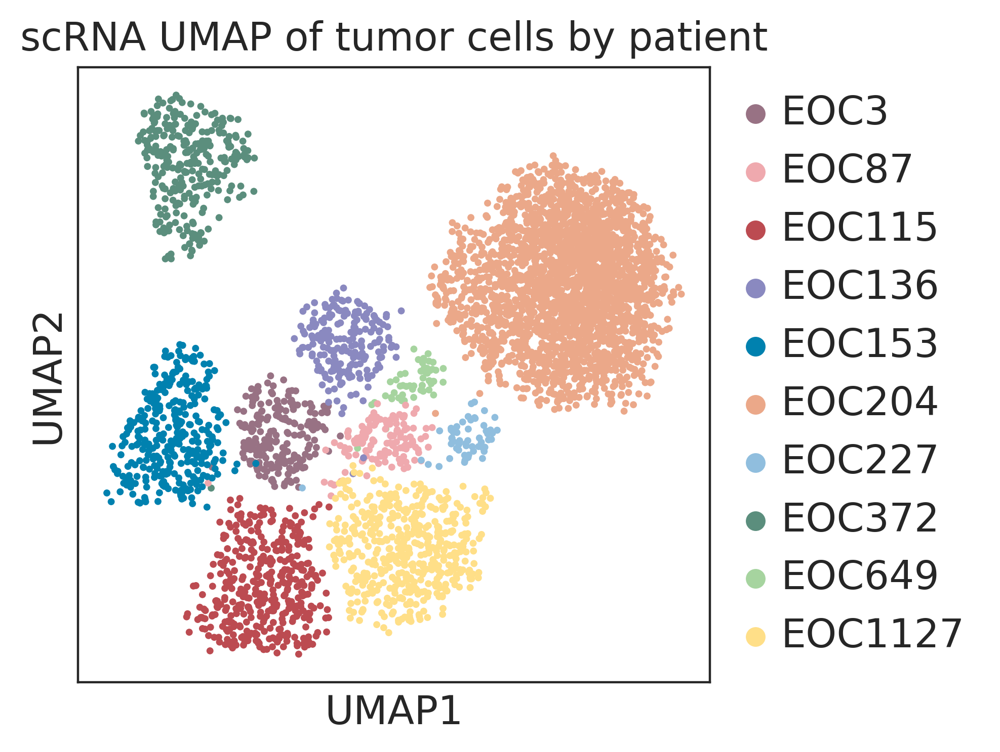

In [83]:
f1 = sc.pl.umap(acts_EOC_msigdb,
                color='HALLMARK_INTERFERON_ALPHA_RESPONSE',
                title='scRNA UMAP of tumor cells with IFN I activity scores',
                frameon=True,
                legend_fontweight='normal',
                cmap='RdBu_r',
                vmax=15, vmin=-5,
                legend_fontsize=6,
                s=25,
                return_fig=True)

f2 = sc.pl.umap(acts_EOC_msigdb,
                color='patient_id',
                title='scRNA UMAP of tumor cells by patient',
                frameon=True,
                legend_fontweight='normal',
                palette=patients_colors_EOC,
                legend_fontsize=14,
                s=25,
                return_fig=True)

## Statistical tests

In [84]:
model_gee_tumor = sm.GEE.from_formula("HALLMARK_IFN_ALPHA_RESPONSE ~ status",
                                      groups="patient_id", data=acts_EOC_msigdb.obs)
result_gee_tumor = model_gee_tumor.fit()
print(result_gee_tumor.summary())

                                  GEE Regression Results                                  
Dep. Variable:        HALLMARK_IFN_ALPHA_RESPONSE   No. Observations:                 4577
Model:                                        GEE   No. clusters:                       10
Method:                               Generalized   Min. cluster size:                  53
                             Estimating Equations   Max. cluster size:                2444
Family:                                  Gaussian   Mean cluster size:               457.7
Dependence structure:                Independence   Num. iterations:                     2
Date:                            Tue, 08 Oct 2024   Scale:                           8.003
Covariance type:                           robust   Time:                         14:26:10
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Int

In [85]:
result_gee_tumor.pvalues['status[T.Responsive]']

8.987587141340138e-08

In [86]:
mean_per_patient = acts_EOC_msigdb.obs.groupby('patient_id')['HALLMARK_IFN_ALPHA_RESPONSE'].mean()
patient_status = acts_EOC_msigdb.obs.groupby('patient_id')['status'].first()
responsive_mean = mean_per_patient[patient_status == 'Responsive']
refractory_mean = mean_per_patient[patient_status == 'Refractory']

In [87]:
def permutation_test(data1, data2, n_permutations=10000):
    observed_diff = np.mean(data1) - np.mean(data2)
    combined = np.concatenate([data1, data2])
    count = 0

    for _ in range(n_permutations):
        np.random.shuffle(combined)
        new_data1 = combined[:len(data1)]
        new_data2 = combined[len(data1):]
        perm_diff = np.mean(new_data1) - np.mean(new_data2)
        if perm_diff >= observed_diff:
            count += 1
    
    return count / n_permutations

p_value_perm = permutation_test(responsive_mean.values, refractory_mean.values)
print(f'Permutation test (patient-level) p-value: {p_value_perm}')

Permutation test (patient-level) p-value: 0.0631


In [88]:
import scipy.stats as stats

refractory_scores = acts_EOC_msigdb.obs.loc[acts_EOC_msigdb.obs['status'] == 'Refractory',
                                            'HALLMARK_IFN_ALPHA_RESPONSE']
responsive_scores = acts_EOC_msigdb.obs.loc[acts_EOC_msigdb.obs['status'] == 'Responsive',
                                            'HALLMARK_IFN_ALPHA_RESPONSE']

levene_stat, p_value_levene = stats.levene(responsive_scores, refractory_scores)

print(f"Levene’s test p-value: {p_value_levene}")

Levene’s test p-value: 3.3560832461609612e-59


## Cellular states (PRIMUS)

In [89]:
# EMT-associated gene signature
C3 = ['DST', 'EGFR', 'EPHB2', 'ITGA6', 'PIK3CD', 'PLEC', 'SFN', 'SMAD3', 'CLTC', 'EIF2AK2',
 'ITGA2', 'KPNA1', 'STAT1', 'BCAR1', 'CCND1', 'COL1A2', 'ITCH', 'MMP1', 'MMP12', 'PML',
 'TNC', 'CDK6', 'FADD', 'FAS', 'MX1', 'E2F3', 'BIRC2', 'CAPN2', 'VASP', 'MMP9', 'DFFA',
 'KPNB1', 'ADAMTS5', 'MMP10', 'AP2B1', 'ASAP1', 'SDCBP', 'CYP1A1', 'CYP1B1', 'CYP3A5',
 'MAFG', 'SLC7A11', 'IGF2']

# Differentiated gene signature
C4 = ['B3GNT7', 'B3GNT8', 'GCNT3', 'MUC15', 'MUC4', 'MUC5B', 'ST3GAL4', 'LCN2', 'S100A8', 'S100A9',
 'ALOX5', 'AOC1', 'B2M', 'C3', 'CEACAM1', 'CEACAM6', 'MGST1', 'OSTF1', 'PPBP', 'S100P',
 'SLPI', 'TMEM173', 'DSC2', 'EVPL', 'IVL', 'KRT13', 'KRT4', 'KRT6A', 'KRT6C', 'HRASLS2',
 'LPCAT4', 'PLBD1', 'RARRES3', 'CDKN2B', 'STEAP4', 'TGFB1', 'CFB', 'CCL28', 'CX3CL1', 'CXCL10']

# Proliferative DNA repair gene signature
C5 = ['AURKA', 'AURKB', 'BIRC5', 'BUB1', 'BUB1B', 'CCNA2', 'CCNB1', 'CCNB2', 'CDC20', 'CDC25C',
 'CDC45', 'CDC6', 'CDCA8', 'CDK1', 'CDT1', 'CENPA', 'CENPE', 'CENPF', 'CENPH', 'CENPK',
 'CENPM', 'CENPN', 'CENPU', 'CKAP5', 'DHFR', 'E2F1', 'H2AFV', 'H2AFZ', 'HAUS1', 'HIST1H2BH',
 'HIST1H3G', 'HIST1H4C', 'HIST2H2AC', 'KIF18A', 'KIF20A', 'KIF23', 'KIF2C', 'LIG1', 'LMNB1',
 'MAD2L1', 'MCM10', 'MCM2', 'MCM3', 'MCM4', 'MCM5', 'MCM6', 'MCM7', 'MCM8', 'NDC80',
 'NEK2', 'NUF2', 'ORC6', 'PCNA', 'PLK1', 'PLK4', 'POLD1', 'POLD2', 'PRIM1', 'PTTG1',
 'RFC2', 'RFC3', 'RFC4', 'RRM2', 'SGO1', 'SGO2', 'SKA1', 'SKA2', 'SKP2', 'SPC24',
 'SPC25', 'TK1', 'TMPO', 'TPX2', 'UBE2C', 'VRK1', 'ZWILCH', 'ZWINT', 'BRCA1', 'CHEK1',
 'CLSPN', 'RHNO1', 'RMI2', 'FANCG', 'HMGB2', 'KIF4A', 'RRM1', 'TYMS', 'RACGAP1',
 'CBX5', 'BRCA2', 'FANCD2', 'RAD51', 'RAD51AP1', 'FANCB', 'FANCI', 'UBE2T', 'KIF11',
 'KIF15', 'KIF20B', 'KIF22', 'KIFC1', 'HIST1H1A', 'HIST1H1B', 'GGH', 'DTYMK', 'AKR1B1']

# Stress-associated gene signature
C7 = ['CEBPB', 'CEBPD', 'FOS', 'IL6', 'JUN', 'JUNB', 'MCL1', 'MYC', 'SOCS3', 'ATF3', 'DUSP1',
 'EGR1', 'FOSB', 'CEBPA', 'DDIT3', 'EGR2', 'CDKN1A', 'GADD45B', 'TNF', 'HES1',
 'HBEGF', 'BCL6', 'NR4A1', 'DUSP6', 'GADD45G', 'ID2', 'NFKBIA', 'PLK3', 'SNAI2',
 'CREB5', 'HLA-G', 'HIST1H2BC', 'HIST1H2BG', 'CALML3', 'SNAI1']

# Cytokine and apoptosis gene signature
C9 = ['CCL20', 'CXCL1', 'IL1R2', 'IL1RN', 'SEC11C', 'SPCS3', 'BIK', 'BIRC3', 'CDKN2A', 'DAB2', 'GJB2']

# Antigen presentation gene signature
C10 = ['CTSL', 'HLA-DMA', 'HLA-DMB', 'HLA-DOA', 'HLA-DPA1', 'HLA-DPB1', 'HLA-DQA1', 'HLA-DQA2', 'HLA-DRA',
 'HLA-DRB5', 'HSP90AB1', 'HSPA2', 'HSPA4', 'HSPA5', 'HSPA6', 'PDIA3', 'CPE', 'CTSF', 'C1R',
 'CXADR', 'SFTPD', 'TUBB2A', 'TUBB6', 'FOLR1', 'GAS6', 'NPC2', 'RUNX1', 'TGFBR2', 'GNAI1',
 'RBPJ', 'IL11RA', 'HIST1H2AE', 'DNAJC3', 'FBXO2', 'HERPUD1', 'HSP90B1', 'SKP1', 'UBE2D1',
 'UBQLN1', 'NECTIN2', 'SDC2', 'CCND3', 'DNAJB9', 'ERP27', 'SIAH1', 'PPP2CA', 'BAG3', 'HSPA12A',
 'BMP2', 'LATS2', 'PPP2R2B', 'PRKCI', 'WNT6', 'IFITM1', 'IFITM2', 'CRMP1', 'DPYSL3', 'PLXNA2',
 'MYL9', 'TNNC1', 'TNNI1', 'TNNT2', 'TLE1', 'TLE4', 'APP', 'PELI2', 'VAMP2', 'DNAJA4', 'PLAT',
 'ACADVL', 'TSPYL2', 'NR1D2', 'PURA', 'GATA6', 'TWIST1', 'RING1', 'BAMBI', 'ATG101', 'RAPGEF2',
 'NR4A3', 'SOX4', 'SLC22A18']

# Interferon signaling gene signature
C3_4 = ['GBP4', 'IFI27', 'IFI35', 'IFIT1', 'ISG15', 'OAS1', 'OAS2', 'STAT2', 'TRIM22', 'TAP1', 'ITGAV']

# RNA processing gene signature
C3_11 = ['BMS1', 'DCAF13', 'MPHOSPH10', 'PNO1', 'ACIN1', 'ROCK1', 'TJP1', 'ESCO1', 'WAPL', 'EIF1AX',
 'PNN', 'RNPS1', 'DYNC1LI1', 'BDP1', 'CRCP', 'PAFAH1B1', 'PRPF40A', 'SFSWAP', 'KMT2A', 'SETD2']

# Proteasomal degradation gene signature
C5_8 = ['AIMP1', 'EIF3I', 'MRPL13', 'MRPL15', 'MRPL16', 'MRPL2', 'MRPL28', 'MRPL3', 'MRPS7', 'RPN2',
 'SRP9', 'TSFM', 'PSMA4', 'PSMB5', 'PSMB6', 'PSMB7', 'PSMC5', 'PSMD8', 'ACTL6A', 'BANF1',
 'PPIA', 'XRCC6', 'VDAC3', 'FH', 'MDH2', 'SDHB', 'TPI1', 'ECHS1', 'HSD17B10', 'POLR2G',
 'NDUFB6', 'HNRNPA2B1', 'HNRNPA3', 'SNRPD3', 'PRDX3', 'PTMA', 'CCT7', 'VBP1', 'COPE']

# TCA cycle gene signature
C5_8_10 = ['GLO1', 'IDH3B', 'NDUFA10', 'NDUFB5', 'PDHA1', 'SUCLG1', 'TRAP1', 'UQCRC1', 'UQCRC2',
 'MDH1', 'ALDH7A1', 'DECR1', 'ECH1', 'ECI2', 'PCCB', 'SHMT1', 'HACD3', 'PTGR1',
 'MGST2', 'PRDX6']

In [90]:
states_markers_dict = {
    'C3': C3,
    'C4': C4,
    'C5': C5,
    'C7': C7,
    'C9': C9,
    'C10': C10,
    'C3_4': C3_4,
    'C3_11': C3_11,
    'C5_8': C5_8,
    'C5_8_10': C5_8_10
}

states_markers_list = []
for cellular_state, genes in states_markers_dict.items():
    for gene in genes:
        states_markers_list.append({'genesymbol': gene, 'cellular_state': cellular_state})

states_markers = pd.DataFrame(states_markers_list)

In [91]:
dc.run_ora(
    mat=adata_EOC,
    net=states_markers,
    source='cellular_state',
    target='genesymbol',
    min_n=3,
    verbose=True,
    use_raw=False
)

4482 features of mat are empty, they will be removed.
Running ora on mat with 4577 samples and 36657 targets for 10 sources.


100%|█████████████████████████████████████████████████████████████████| 4577/4577 [00:34<00:00, 132.58it/s]


In [92]:
acts = dc.get_acts(adata_EOC, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed for pvals=0
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

acts

AnnData object with n_obs × n_vars = 4577 × 10
    obs: 'sample', 'patient_id', 'anatomical_location', 'cell_type', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'status', 'SBS3', 'cell_id'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'patient_id_colors', 'status_colors', 'SBS3_colors', 'anatomical_location_colors'
    obsm: 'X_pca', 'X_umap', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals', 'ulm_estimate', 'ulm_pvals', 'collectri_ulm_estimate', 'collectri_ulm_pvals', 'ora_estimate', 'ora_pvals'

In [94]:
acts

AnnData object with n_obs × n_vars = 4577 × 10
    obs: 'sample', 'patient_id', 'anatomical_location', 'cell_type', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'status', 'SBS3', 'cell_id'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'patient_id_colors', 'status_colors', 'SBS3_colors', 'anatomical_location_colors'
    obsm: 'X_pca', 'X_umap', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals', 'ulm_estimate', 'ulm_pvals', 'collectri_ulm_estimate', 'collectri_ulm_pvals', 'ora_estimate', 'ora_pvals'

In [95]:
df = dc.rank_sources_groups(acts,
                            groupby='cell_id',
                            reference='rest',
                            method='wilcoxon')
df.head(2)

,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,AAACCTGAGGTTACCT-EOC3_pPer,rest,C5_8,1.493643,4.681183,0.135269,0.470959
1,AAACCTGAGGTTACCT-EOC3_pPer,rest,C5_8_10,1.364979,1.881106,0.172260,0.470959


In [96]:
n_ctypes = 3
ctypes_dict = df.groupby('group').head(n_ctypes).groupby('group')['names'].apply(lambda x: list(x)).to_dict()

In [97]:
annotation_dict = df.groupby('group').head(1).set_index('group')['names'].to_dict()

/mnt/csc-gc8/work/afenteva/virtualenvs/jupyter/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


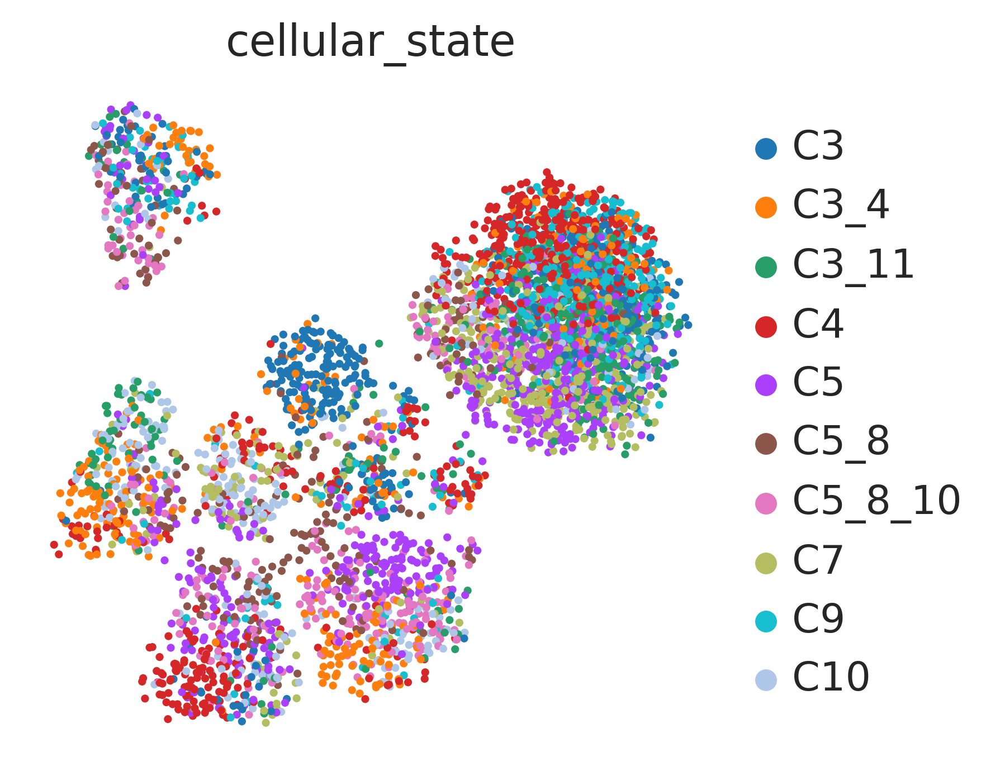

In [98]:
adata_EOC.obs['cellular_state'] = [annotation_dict[clust] for clust in adata_EOC.obs['cell_id']]
sc.pl.umap(adata_EOC, color='cellular_state')

In [100]:
adata_EOC.obs.groupby('patient_id')['cellular_state'].value_counts()

patient_id  cellular_state
EOC3        C10               68
            C7                46
            C4                36
            C5                14
            C5_8              12
                              ..
EOC1127     C4                21
            C3_11             13
            C9                13
            C7                 7
            C3                 2
Name: cellular_state, Length: 100, dtype: int64

In [101]:
adata_EOC.obs[['sample', 'patient_id', 'anatomical_location', 'status', 'SBS3', 'cellular_state']].head(3)

,sample,patient_id,anatomical_location,status,SBS3,cellular_state
AACACGTAGTTAAGTG-EOC649_pOme,EOC649_pOme,EOC649,Omentum,Responsive,HRP,C5
AACGTTGGTTTGTGTG-EOC649_pOme,EOC649_pOme,EOC649,Omentum,Responsive,HRP,C9
AAGGTTCAGGGTGTTG-EOC649_pOme,EOC649_pOme,EOC649,Omentum,Responsive,HRP,C4


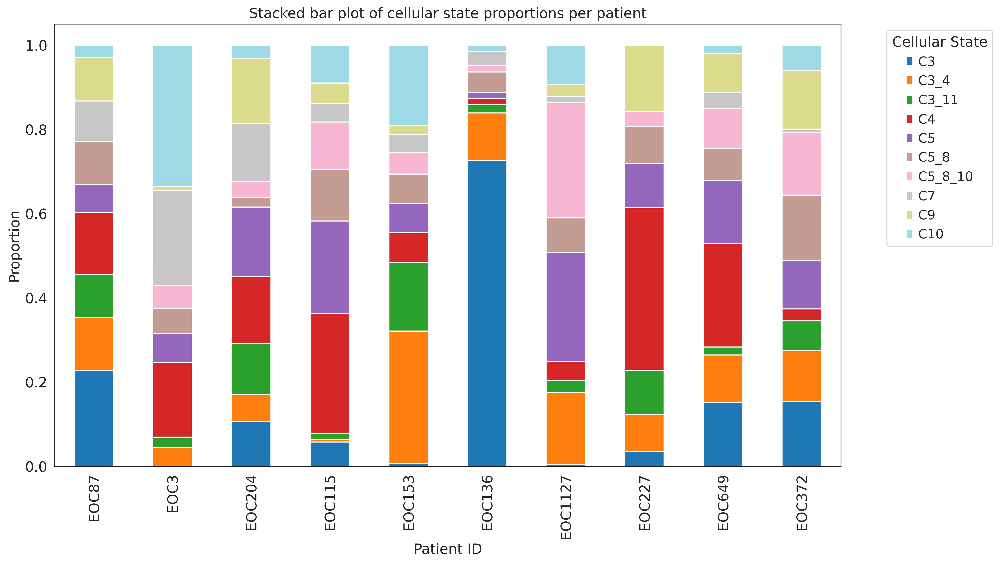

In [102]:
df = adata_EOC.obs[['sample', 'patient_id', 'anatomical_location', 'status', 'SBS3', 'cellular_state']]

cellular_state_proportions = (
    df.groupby(['patient_id', 'cellular_state'])
    .size()
    .unstack(fill_value=0)
    .apply(lambda x: x / x.sum(), axis=1)
)

cellular_state_proportions = cellular_state_proportions.reindex(patients_ordered)

cellular_state_proportions.plot(kind='bar', stacked=True, figsize=(14, 8), colormap="tab20", )

plt.title('Stacked bar plot of cellular state proportions per patient')
plt.ylabel('Proportion')
plt.xlabel('Patient ID')
plt.legend(title='Cellular State', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=90)
plt.tight_layout()
plt.grid(False)

plt.show()

In [103]:
cellular_state_counts = adata_EOC.obs.groupby(['patient_id', 'status', 'cellular_state']).size().reset_index(name='count')
total_counts_per_patient = adata_EOC.obs.groupby(['patient_id', 'status']).size().reset_index(name='total_count')
merged_df = pd.merge(cellular_state_counts, total_counts_per_patient, on=['patient_id', 'status'])
merged_df['proportion'] = merged_df['count'] / merged_df['total_count']
melted_df = merged_df[['patient_id', 'status', 'cellular_state', 'proportion']]

In [104]:
p_values = {}

for state in melted_df['cellular_state'].unique():
    # print(state)
    responsive = melted_df[(melted_df['cellular_state'] == state) &\
                           (melted_df['status'] == 'Responsive')]['proportion'].dropna()
    refractory = melted_df[(melted_df['cellular_state'] == state) &\
                           (melted_df['status'] == 'Refractory')]['proportion'].dropna()
    
    t_stat, p_val = ttest_ind(responsive, refractory, equal_var=False)
    
    p_values[state] = p_val

In [105]:
p_values

{'C3': 0.5290394832503187,
 'C3_4': 0.057898411822550684,
 'C3_11': 0.9662666665633828,
 'C4': 0.4101871248923883,
 'C5': 0.8344204967579325,
 'C5_8': 0.7335182573187312,
 'C5_8_10': 0.2919049804115646,
 'C7': 0.07212977590609841,
 'C9': 0.900695974027762,
 'C10': 0.49826940207382536}

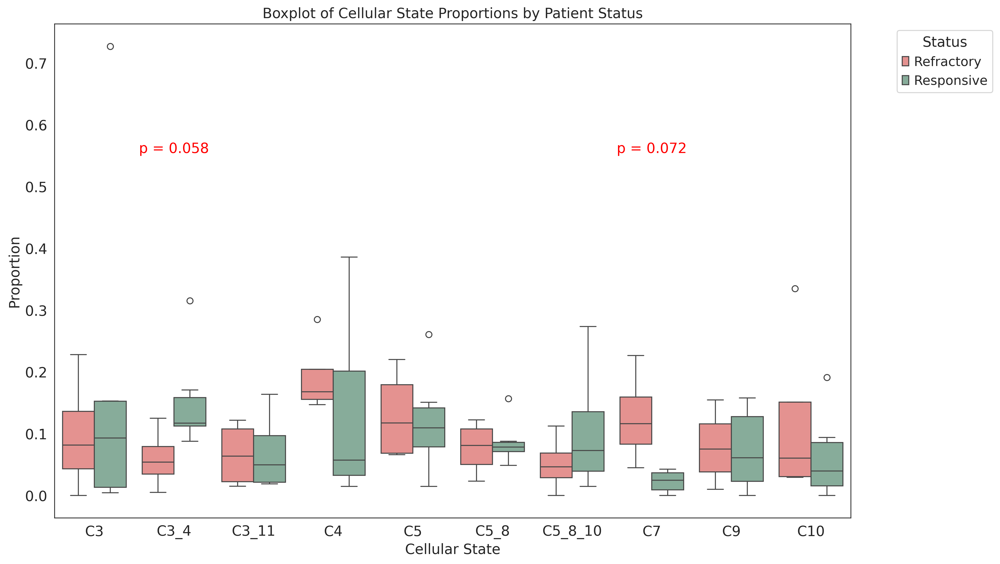

In [106]:
plt.figure(figsize=(14, 8))
sns.boxplot(x='cellular_state', y='proportion',
            hue='status', data=melted_df,
            palette=status_palette)

plt.title('Boxplot of Cellular State Proportions by Patient Status')
plt.ylabel('Proportion')
plt.xlabel('Cellular State')
plt.legend(title='Status', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=0)

for state, p_val in p_values.items():
    if p_val < 0.1: 
        plt.text(
            x=melted_df['cellular_state'].unique().tolist().index(state), 
            y=0.55, 
            s=f'p = {p_val:.3f}', 
            ha='center', 
            va='bottom', 
            color='red'
        )

plt.tight_layout()
plt.grid(False)

plt.show()